In [1]:
import pandas as pd

In [ ]:
#Base de datos de Australia
#https://www.kaggle.com/datasets/jsphyg/weather-dataset-rattle-package
df = pd.read_csv('C:\WorkPython\Ciencia De Datos\Datos\Series de Tiempo\weatherAUS.csv\weatherAUS.csv')
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [31]:
#Investigando los tipos de datos se puede ver que hay columnas con datos de tipo object
#Hay que transformarlas de manera que sirvan para el análisis

df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df['RainToday'] = df['RainToday'].map({'No': 0, 'Yes': 1})
df['RainTomorrow'] = df['RainTomorrow'].map({'No': 0, 'Yes': 1})
df['WindGustDir'] = df['WindGustDir'].map({'N': 0, 'NNE': 1, 'NE': 2, 'ENE': 3, 'E': 4, 'ESE': 5, 'SE': 6, 'SSE': 7,
'SSW': 8, 'SW': 9, 'WSW': 10, 'W': 11, 'WNW': 12, 'NW': 13, 'NNW': 14})
df['WindDir9am'] = df['WindDir9am'].map({'N': 0, 'NNE': 1, 'NE': 2, 'ENE': 3, 'E': 4, 'ESE': 5, 'SE': 6, 'SSE': 7,
'SSW': 8, 'SW': 9, 'WSW': 10, 'W': 11, 'WNW': 12, 'NW': 13, 'NNW': 14})
df['WindDir3pm'] = df['WindDir3pm'].map({'N': 0, 'NNE': 1, 'NE': 2, 'ENE': 3, 'E': 4, 'ESE': 5, 'SE': 6, 'SSE': 7,
'SSW': 8, 'SW': 9, 'WSW': 10, 'W': 11, 'WNW': 12, 'NW': 13, 'NNW': 14})

df.drop(columns=['Evaporation', 'Sunshine'], inplace=True)
df.dropna(inplace=True)

In [32]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
4,2008-12-05,Albury,17.5,32.3,1.0,11.0,41.0,3.0,13.0,7.0,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0.0,0.0
11,2008-12-12,Albury,15.9,21.7,2.2,1.0,31.0,2.0,3.0,15.0,...,89.0,91.0,1010.5,1004.2,8.0,8.0,15.9,17.0,1.0,1.0
12,2008-12-13,Albury,15.9,18.6,15.6,11.0,61.0,14.0,14.0,28.0,...,76.0,93.0,994.3,993.0,8.0,8.0,17.4,15.8,1.0,1.0
16,2008-12-17,Albury,14.1,20.9,0.0,3.0,22.0,8.0,4.0,11.0,...,69.0,82.0,1012.2,1010.4,8.0,1.0,17.2,18.1,0.0,1.0
17,2008-12-18,Albury,13.5,22.9,16.8,11.0,63.0,0.0,12.0,6.0,...,80.0,65.0,1005.8,1002.2,8.0,1.0,18.0,21.5,1.0,1.0


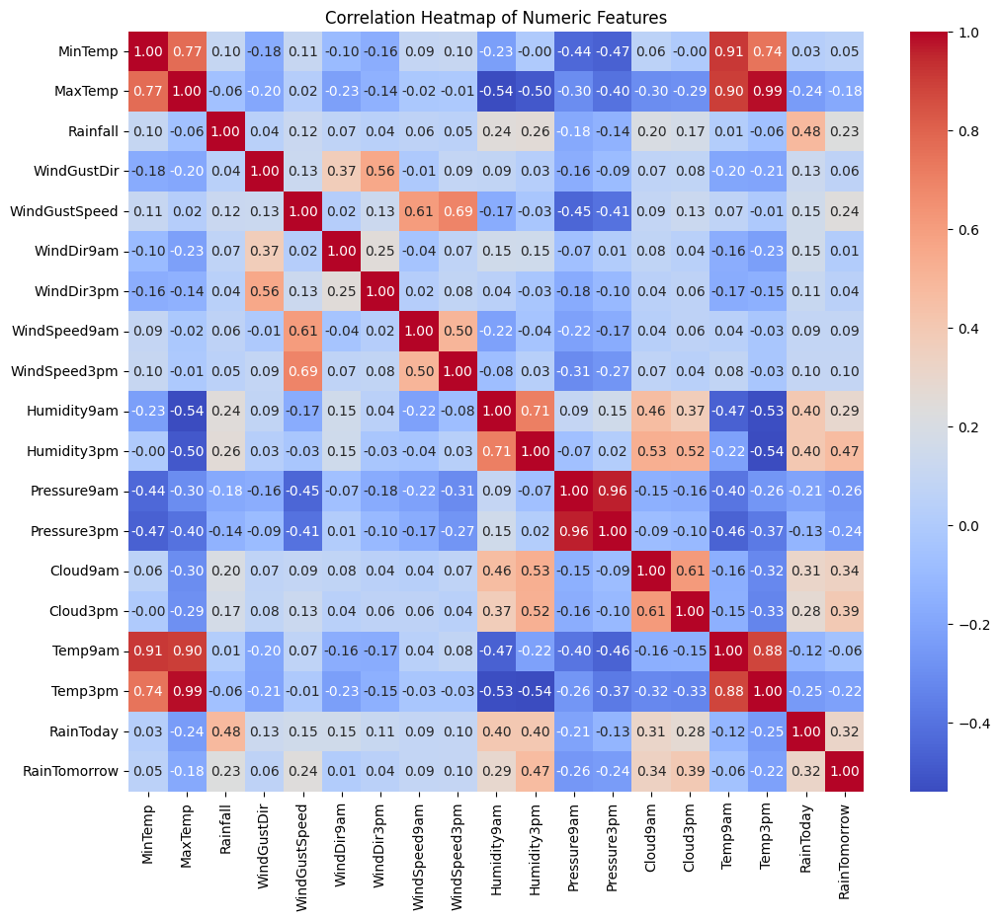

In [37]:
#Visualizando los datos
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

numeric_df = df.select_dtypes(include=[np.number])

if numeric_df.shape[1] >= 4:
    plt.figure(figsize=(12, 10))
    corr_matrix = numeric_df.corr()
    sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm')
    plt.title('Correlation Heatmap of Numeric Features')
    plt.show()
else:
    print('Not enough numeric columns for a correlation heatmap.')

In [41]:
#Eliminemos las columnas con mayor correlación

# Crear un conjunto para almacenar las columnas a eliminar
columns_to_drop = set()

# Establecer un umbral de correlación
threshold = 0.9

# Identificar columnas correlacionadas
for i in range(len(corr_matrix.columns)):
    for j in range(i+1, len(corr_matrix.columns)):
        if abs(corr_matrix.iloc[i, j]) > threshold:
            colname = corr_matrix.columns[j]
            columns_to_drop.add(colname)

# Eliminar columnas altamente correlacionadas
df_cleaned = df.drop(columns=columns_to_drop)

print("Columnas eliminadas:", columns_to_drop)

Columnas eliminadas: {'Temp3pm', 'Temp9am', 'Pressure3pm'}


In [44]:
df_cleaned.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Cloud9am,Cloud3pm,RainToday,RainTomorrow
4,2008-12-05,Albury,17.5,32.3,1.0,11.0,41.0,3.0,13.0,7.0,20.0,82.0,33.0,1010.8,7.0,8.0,0.0,0.0
11,2008-12-12,Albury,15.9,21.7,2.2,1.0,31.0,2.0,3.0,15.0,13.0,89.0,91.0,1010.5,8.0,8.0,1.0,1.0
12,2008-12-13,Albury,15.9,18.6,15.6,11.0,61.0,14.0,14.0,28.0,28.0,76.0,93.0,994.3,8.0,8.0,1.0,1.0
16,2008-12-17,Albury,14.1,20.9,0.0,3.0,22.0,8.0,4.0,11.0,9.0,69.0,82.0,1012.2,8.0,1.0,0.0,1.0
17,2008-12-18,Albury,13.5,22.9,16.8,11.0,63.0,0.0,12.0,6.0,20.0,80.0,65.0,1005.8,8.0,1.0,1.0,1.0


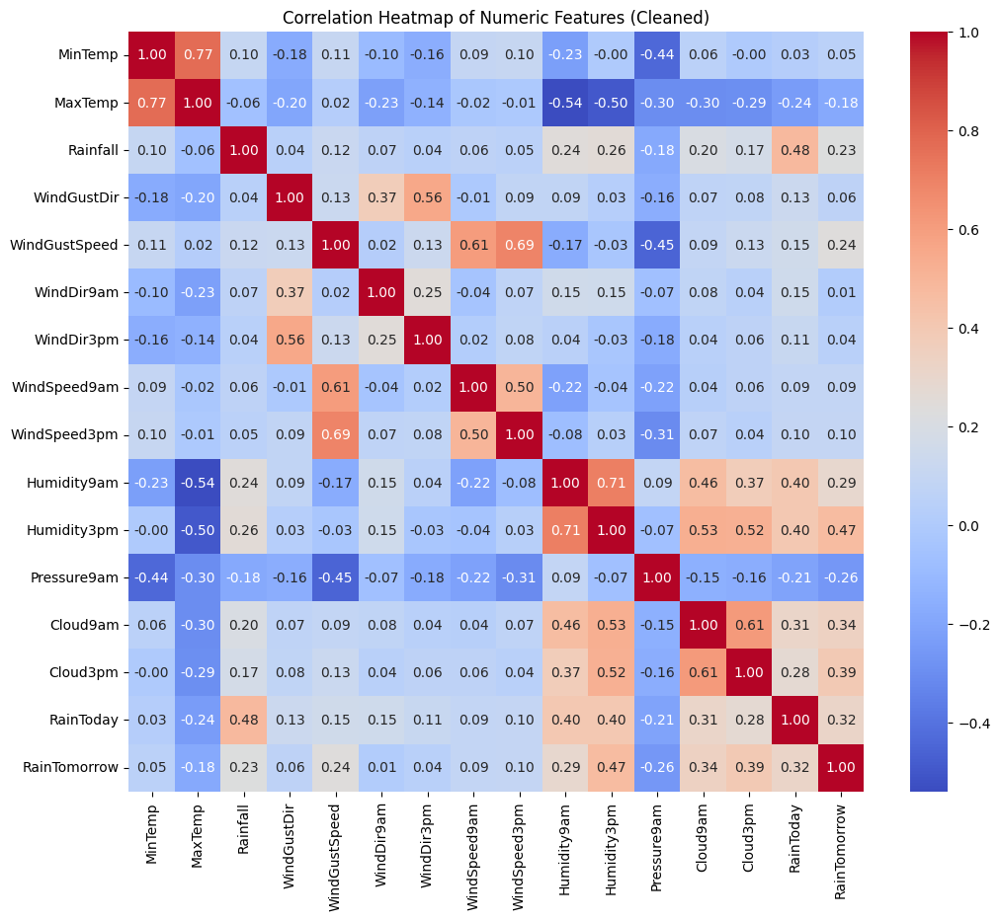

In [45]:
numeric_df_cleaned = df_cleaned.select_dtypes(include=[np.number])
if numeric_df_cleaned.shape[1] >= 4:
    plt.figure(figsize=(12, 10))
    corr_matrix_cleaned = numeric_df_cleaned.corr()
    sns.heatmap(corr_matrix_cleaned, annot=True, fmt='.2f', cmap='coolwarm')
    plt.title('Correlation Heatmap of Numeric Features (Cleaned)')
    plt.show()

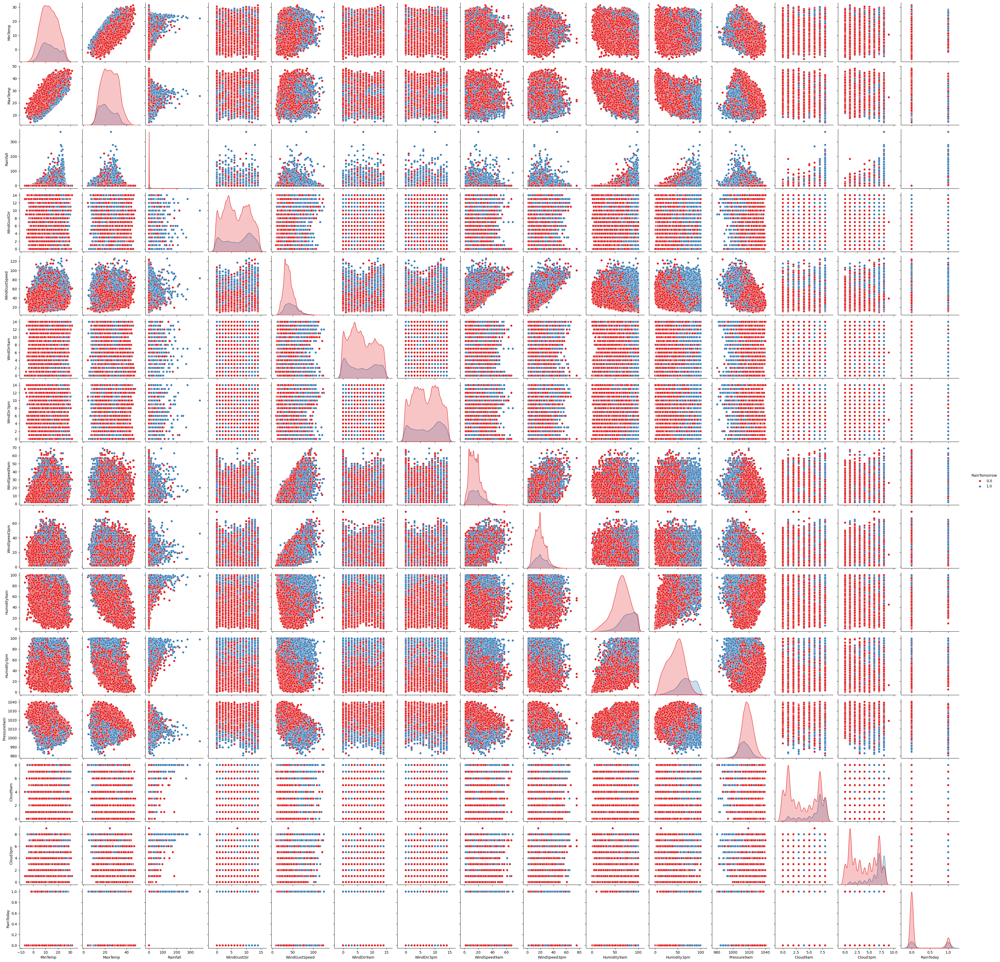

In [46]:
sns.pairplot(df_cleaned, diag_kind='kde', hue='RainTomorrow', palette='Set1')
plt.show()